# Which method works best for which case

In [43]:
import pandas as pd
import numpy as np
import ast
import seaborn
from sklearn import tree, metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
pd.options.display.max_columns = None
pd.set_option('display.max_colwidth', None)

In [209]:
X_train.columns.to_list()

['median_unique_values_dists',
 'median_str_dists',
 'avg_intersection_perc_100_samples',
 'datasets_nrows_diff',
 'datasets_ncols_diff',
 'avg_avg_obfuscators_by_dtype',
 'avg_avg_obfuscators_by_colname',
 'avg_column_names_string_distance',
 'avg_percentage_cols_involved_in_rel',
 'cleaned_True',
 'provenance_synthetic',
 'split_type_horizontal',
 'split_type_no_split',
 'split_type_vertical',
 'relationship_type_join/semantic join',
 'relationship_type_semantic join',
 'relationship_type_union',
 'relationship_type_view union',
 'instances_noisy_verbatim_verbatim',
 'schema_noisy_verbatim_verbatim',
 'rel_string_True',
 'rel_numeric_True']

In [210]:
translate_col_names_to_thesis_version = {'avg_intersection_perc_100_samples': 'identicalColNamesAvgIntersection100Samples',
 'avg_exact_col_match': 'avgExactColMatch',
 'avg_fuzzy_col_match': 'avgFuzzyColMatch',
 'avg_null_attributes': 'avgNullAttributes',
 'datasets_nrows_diff': 'nRowDiff',
 'datasets_ncols_diff': 'nColDiff',
 'datasets_nrows_max': 'nRowMax',
 'datasets_ncols_max': 'nColMax',
 'cleaned_True': 'cleaned',
 'provenance_synthetic': 'provenanceSynthetic',
                                         'median_unique_values_dists': 'medianUniqueValueDists',
 'median_str_dists':'medianStrDists',
                                         'avg_avg_obfuscators_by_dtype': 'avgObfuscatorsByDtype',
 'avg_avg_obfuscators_by_colname': 'avgObfuscatorsByColname',
 'avg_column_names_string_distance': 'avgColnamesStringDistance',
 'avg_percentage_cols_involved_in_rel': 'avgColsInvolvedInRel',
                                        'split_type_horizontal': 'splitTypeHorizontal',
 'split_type_no_split': 'splitTypeNoSplit',
 'split_type_vertical': 'splitTypeVertical',
 'relationship_type_join/semantic join': 'relationshipTypeJoin',
 'relationship_type_semantic join': 'relationshipTypeSemanticJoin',
 'relationship_type_union': 'relationshipTypeUnion',
 'relationship_type_view union': 'relationshipTypeViewUnion',
 'instances_noisy_verbatim_verbatim': 'instancesVerbatim',
 'schema_noisy_verbatim_verbatim': 'schemaVerbatim',
 'rel_string_True': 'relString',
 'rel_numeric_True': 'relNumeric'}

In [2]:
method_results = pd.read_csv("method_results.csv")
method_results.head()

C:\Users\Phaina\AppData\Local\Temp/ipykernel_26548/696791498.py:1: DtypeWarning: Columns (16) have mixed types. Specify dtype option on import or set low_memory=False.
  method_results = pd.read_csv("method_results.csv")


,experiment_name,method,elapsed_process_time,join_type,schema_noisy_verbatim,instances_noisy_verbatim,0,precision,recall,f1_score,precision_at_10_percent,precision_at_30_percent,precision_at_50_percent,precision_at_70_percent,precision_at_90_percent,recall_at_sizeof_ground_truth,0.1,precision_at_20_percent,precision_at_40_percent,precision_at_60_percent,precision_at_80_percent
0,book_titles-collaborative_books_df,COMA_OPT,3.421875,join,verbatim,verbatim,NaN,1.0000,1.0000,1.000000,1.0,1.0,1.000,1.000000,1.000000,1.0000,NaN,NaN,NaN,NaN,NaN
1,book_titles_-_collaborative_book_metadata,COMA_OPT,2.781250,join,verbatim,verbatim,NaN,1.0000,1.0000,1.000000,1.0,1.0,1.000,1.000000,1.000000,1.0000,NaN,NaN,NaN,NaN,NaN
2,collaborative_book_metadata-collaborative_books_df,COMA_OPT,0.593750,join,verbatim,verbatim,NaN,0.5000,1.0000,0.666667,0.0,0.5,0.500,0.666667,0.500000,0.5000,NaN,NaN,NaN,NaN,NaN
3,Frosttage_Heissetage,COMA_OPT,0.015625,union,verbatim,verbatim,NaN,0.9375,0.9375,0.937500,1.0,0.8,0.875,0.916667,0.933333,0.9375,NaN,NaN,NaN,NaN,NaN
4,Frosttage_Niederschlag,COMA_OPT,0.062500,union,verbatim,verbatim,NaN,0.9375,0.9375,0.937500,1.0,0.8,0.875,0.916667,0.933333,0.9375,NaN,NaN,NaN,NaN,NaN


In [3]:
best_method_properties = pd.read_csv("best_method_properties_2.csv")
best_method_properties.rename( columns={'Unnamed: 0':'experiment_name'}, inplace=True )
best_method_properties.drop(columns=["0"], axis=1, inplace=True)
best_method_properties.head()

,experiment_name,best_methods,cleaned,percentage_cols_involved_in_rel,column_names_string_distance,dataset_class_type,datasets_nrows,datasets_ncols,rel_numeric,rel_string,avg_obfuscators_by_colname,avg_obfuscators_by_dtype,provenance,schema_noisy_verbatim,instances_noisy_verbatim,relationship_type,avg_intersection_perc_5_samples,avg_intersection_perc_10_samples,avg_intersection_perc_15_samples,avg_intersection_perc_50_samples,avg_intersection_perc_100_samples,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,avg_str_dists,median_str_dists,raw_str_dists,avg_unique_values_dists,median_unique_values_dists,raw_unique_values_dists,split_type,0.1,horizontal_split_amount,vertical_split_amount
0,book_titles-collaborative_books_df,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.5', 'JL_ColumnNamesOnly_0.7', 'JL_ColumnNamesOnly_0.8'], 'min_times': [0.234375, 0.234375, 0.234375], 'recall_at_sizeof_ground_truth': [1.0, 1.0, 1.0]}",True,"dict_values([1.0, 0.2857142857142857])","[0.0, 0.0]",language,"[1447341, 196296]","[2, 7]",True,True,"[0.0, 0.0]","[0.0, 2.0]",real,verbatim,verbatim,join,0.0000,0.00000,0.000000,0.00000,0.01000,2.0,2.0,0.001622,2.163001,2.163001,"[1.8888664757367293, 2.437136260521733]",1249156.00,1249156.0,"[1446443, 1051869]",NaN,NaN,NaN,NaN
1,book_titles_-_collaborative_book_metadata,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.8'], 'min_times': [0.171875], 'recall_at_sizeof_ground_truth': [1.0]}",True,"dict_values([1.0, 0.18181818181818182])","[0.0, 0.0]",language,"[1447341, 96]","[2, 11]",True,True,"[0.0, 0.0]","[0.0, 4.5]",real,verbatim,verbatim,join,0.0000,0.00000,0.000000,0.00000,0.00000,2.0,2.0,0.001622,-1.665304,-1.665304,"[1.353468403437752, -4.684077365838455]",1249950.50,1249950.5,"[1447245, 1052656]",NaN,NaN,NaN,NaN
2,collaborative_book_metadata-collaborative_books_df,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.4', 'JL_ColumnNamesOnly_0.6', 'JL_ColumnNamesOnly_0.8'], 'min_times': [0.046875, 0.046875, 0.046875], 'recall_at_sizeof_ground_truth': [1.0, 1.0, 1.0]}",True,"dict_values([0.18181818181818182, 0.2857142857142857])","[0.0, 0.0]",language,"[96, 196296]","[11, 7]",True,True,"[0.0, 0.0]","[4.5, 2.0]",real,verbatim,verbatim,join,0.0000,0.00000,0.000000,0.04000,0.06000,3.0,3.0,0.000000,3.828306,3.828306,"[0.5353980722989773, 7.121213626360188]",-794.50,-794.5,"[-802, -787]",NaN,NaN,NaN,NaN
3,Frosttage_Heissetage,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.8'], 'min_times': [0.0], 'recall_at_sizeof_ground_truth': [1.0]}",False,"dict_values([1.0, 1.0])","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",numeric,"[412, 412]","[16, 16]",True,True,"[0.0, 0.0]","[9.875, 6.125]",real,verbatim,verbatim,union,0.0625,0.06250,0.041667,0.03000,0.03000,16.0,16.0,0.000000,1.115140,0.069175,"[0.0, 0.0, 0.0, 3.0, 3.0, 2.8567961165048543, 0.133495145631068, 0.004854368932039055, 0.0024271844660193054, 0.0024271844660193054, 0.0024271844660193054, 0.0024271844660193054, 2.012135922330097, 2.504854368932039, 2.9902912621359223, 1.3300970873786406]",68.75,56.5,"[0, 0, 0, 151, 130, 143, 123, 38, -9, -48, -36, 12, 75, 152, 145, 224]",NaN,NaN,NaN,NaN
4,Frosttage_Niederschlag,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.8'], 'min_times': [0.015625], 'recall_at_sizeof_ground_truth': [1.0]}",False,"dict_values([1.0, 1.0])","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",numeric,"[412, 412]","[16, 16]",True,True,"[0.0, 0.0]","[9.875, 6.125]",real,verbatim,verbatim,union,0.0125,0.00625,0.004167,0.00375,0.00125,16.0,16.0,0.000000,1.115140,0.069175,"[0.0, 0.0, 0.0, 3.0, 3.0, 2.8567961165048543, 0.133495145631068, 0.004854368932039055, 0.0024271844660193054, 0.0024271844660193054, 0.0024271844660193054, 0.0024271844660193054, 2.012135922330097, 2.504854368932039, 2.9902912621359223, 1.3300970873786406]",68.75,56.5,"[0, 0, 0, 151, 130, 143, 123, 38, -9, -48, -36, 12, 75, 152, 145, 224]",NaN,NaN,NaN,NaN


In [4]:
def extract_simple_method_name(method_name):
    if "CorrelationClustering" in method_name:
        return "DistributionBased"
    if "Coma{" in method_name:
        if "COMA_OPT_INST" in method_name:
            return "COMA_OPT_INST"
        elif "COMA_OPT" in method_name:
            return "COMA_OPT"
        else:
            return method_name
    if "{" in method_name:
        return method_name.split("{")[0]
    elif "_" in method_name and "COMA" not in method_name and "JL" not in method_name:
        return method_name.split("_")[0]
    elif "JL_ColumnNamesOnly" in method_name:
        return "JL_ColumnNamesOnly"
    else:
        return method_name

def extract_simple_method_names(best_methods):
    # extract method names without parameters. if multiple ones, in alphabetical order.
    best_methods = ast.literal_eval(best_methods)
    method_names = best_methods["best_performing_methods"]
    simple_method_names = [extract_simple_method_name(m) for m in method_names]
    simple_method_names = list(set(simple_method_names))
    ordered_simple_method_names = sorted(simple_method_names)
    return ordered_simple_method_names

def extract_JL_cutoff(best_methods):
    #JL_ColumnNamesOnly_0.5
    best_methods = ast.literal_eval(best_methods)
    method_names = best_methods["best_performing_methods"]
    method_names = list(set(method_names))
    if all('JL_ColumnNamesOnly' in method for method in method_names):
        cutoffs = [x.split("_")[-1] for x in method_names]
        return cutoffs
    
def extract_max_JL_cutoff(best_methods):
    #JL_ColumnNamesOnly_0.5
    best_methods = ast.literal_eval(best_methods)
    method_names = best_methods["best_performing_methods"]
    method_names = list(set(method_names))
    if all('JL_ColumnNamesOnly' in method for method in method_names):
        cutoffs = [x.split("_")[-1] for x in method_names]
        max_cutoff = max(cutoffs)
        return max_cutoff

In [5]:
best_method_properties["ordered_simple_best_method_names"] = best_method_properties["best_methods"].apply(extract_simple_method_names)
best_method_properties["ordered_simple_best_method_names_no_tiebreaks"] = best_method_properties["best_methods"].apply(extract_simple_method_names)

In [6]:
best_method_properties["JL_cutoffs"] = best_method_properties["best_methods"].apply(extract_JL_cutoff)
best_method_properties["max_JL_cutoff"] = best_method_properties["best_methods"].apply(extract_max_JL_cutoff)

In [7]:
best_method_properties.head()

,experiment_name,best_methods,cleaned,percentage_cols_involved_in_rel,column_names_string_distance,dataset_class_type,datasets_nrows,datasets_ncols,rel_numeric,rel_string,avg_obfuscators_by_colname,avg_obfuscators_by_dtype,provenance,schema_noisy_verbatim,instances_noisy_verbatim,relationship_type,avg_intersection_perc_5_samples,avg_intersection_perc_10_samples,avg_intersection_perc_15_samples,avg_intersection_perc_50_samples,avg_intersection_perc_100_samples,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,avg_str_dists,median_str_dists,raw_str_dists,avg_unique_values_dists,median_unique_values_dists,raw_unique_values_dists,split_type,0.1,horizontal_split_amount,vertical_split_amount,ordered_simple_best_method_names,ordered_simple_best_method_names_no_tiebreaks,JL_cutoffs,max_JL_cutoff
0,book_titles-collaborative_books_df,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.5', 'JL_ColumnNamesOnly_0.7', 'JL_ColumnNamesOnly_0.8'], 'min_times': [0.234375, 0.234375, 0.234375], 'recall_at_sizeof_ground_truth': [1.0, 1.0, 1.0]}",True,"dict_values([1.0, 0.2857142857142857])","[0.0, 0.0]",language,"[1447341, 196296]","[2, 7]",True,True,"[0.0, 0.0]","[0.0, 2.0]",real,verbatim,verbatim,join,0.0000,0.00000,0.000000,0.00000,0.01000,2.0,2.0,0.001622,2.163001,2.163001,"[1.8888664757367293, 2.437136260521733]",1249156.00,1249156.0,"[1446443, 1051869]",NaN,NaN,NaN,NaN,[JL_ColumnNamesOnly],[JL_ColumnNamesOnly],"[0.5, 0.7, 0.8]",0.8
1,book_titles_-_collaborative_book_metadata,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.8'], 'min_times': [0.171875], 'recall_at_sizeof_ground_truth': [1.0]}",True,"dict_values([1.0, 0.18181818181818182])","[0.0, 0.0]",language,"[1447341, 96]","[2, 11]",True,True,"[0.0, 0.0]","[0.0, 4.5]",real,verbatim,verbatim,join,0.0000,0.00000,0.000000,0.00000,0.00000,2.0,2.0,0.001622,-1.665304,-1.665304,"[1.353468403437752, -4.684077365838455]",1249950.50,1249950.5,"[1447245, 1052656]",NaN,NaN,NaN,NaN,[JL_ColumnNamesOnly],[JL_ColumnNamesOnly],[0.8],0.8
2,collaborative_book_metadata-collaborative_books_df,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.4', 'JL_ColumnNamesOnly_0.6', 'JL_ColumnNamesOnly_0.8'], 'min_times': [0.046875, 0.046875, 0.046875], 'recall_at_sizeof_ground_truth': [1.0, 1.0, 1.0]}",True,"dict_values([0.18181818181818182, 0.2857142857142857])","[0.0, 0.0]",language,"[96, 196296]","[11, 7]",True,True,"[0.0, 0.0]","[4.5, 2.0]",real,verbatim,verbatim,join,0.0000,0.00000,0.000000,0.04000,0.06000,3.0,3.0,0.000000,3.828306,3.828306,"[0.5353980722989773, 7.121213626360188]",-794.50,-794.5,"[-802, -787]",NaN,NaN,NaN,NaN,[JL_ColumnNamesOnly],[JL_ColumnNamesOnly],"[0.8, 0.6, 0.4]",0.8
3,Frosttage_Heissetage,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.8'], 'min_times': [0.0], 'recall_at_sizeof_ground_truth': [1.0]}",False,"dict_values([1.0, 1.0])","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",numeric,"[412, 412]","[16, 16]",True,True,"[0.0, 0.0]","[9.875, 6.125]",real,verbatim,verbatim,union,0.0625,0.06250,0.041667,0.03000,0.03000,16.0,16.0,0.000000,1.115140,0.069175,"[0.0, 0.0, 0.0, 3.0, 3.0, 2.8567961165048543, 0.133495145631068, 0.004854368932039055, 0.0024271844660193054, 0.0024271844660193054, 0.0024271844660193054, 0.0024271844660193054, 2.012135922330097, 2.504854368932039, 2.9902912621359223, 1.3300970873786406]",68.75,56.5,"[0, 0, 0, 151, 130, 143, 123, 38, -9, -48, -36, 12, 75, 152, 145, 224]",NaN,NaN,NaN,NaN,[JL_ColumnNamesOnly],[JL_ColumnNamesOnly],[0.8],0.8
4,Frosttage_Niederschlag,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.8'], 'min_times': [0.015625], 'recall_at_sizeof_ground_truth': [1.0]}",False,"dict_values([1.0, 1.0])","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",numeric,"[412, 412]","[16, 16]",True,True,"[0.0, 0.0]","[9.875, 6.125]",real,verbatim,verbatim,union,0.0125,0.00625,0.004167,0.00375,0.00125,16.0,16.0,0.000000,1.115140,0.069175,"[0.0, 0.0, 0.0, 3.0, 3.0, 2.8567961165048543, 0.1

In [8]:
def schema_or_instance(best_method_names_no_tiebreaks):
    schema_methods = set(["COMA_OPT", "Cupid", "JL_ColumnNamesOnly", "SimilarityFlooding"])
    instance_methods = set(["JaccardLevenMatcher", "COMA_OPT_INST", "DistributionBased"])
    schema = False
    instance = False
    set_best_methods = set(best_method_names_no_tiebreaks)
    if len(set_best_methods.intersection(schema_methods)) > 0:
        schema = True
    if len(set_best_methods.intersection(instance_methods)) > 0:
        instance = True
    return {"best_methods_include_schema_methods": schema,
            "best_methods_include_instance_methods": instance}

best_method_properties["schema_or_instance_based_methods"] = best_method_properties["ordered_simple_best_method_names_no_tiebreaks"].apply(schema_or_instance)
best_method_properties.head()

,experiment_name,best_methods,cleaned,percentage_cols_involved_in_rel,column_names_string_distance,dataset_class_type,datasets_nrows,datasets_ncols,rel_numeric,rel_string,avg_obfuscators_by_colname,avg_obfuscators_by_dtype,provenance,schema_noisy_verbatim,instances_noisy_verbatim,relationship_type,avg_intersection_perc_5_samples,avg_intersection_perc_10_samples,avg_intersection_perc_15_samples,avg_intersection_perc_50_samples,avg_intersection_perc_100_samples,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,avg_str_dists,median_str_dists,raw_str_dists,avg_unique_values_dists,median_unique_values_dists,raw_unique_values_dists,split_type,0.1,horizontal_split_amount,vertical_split_amount,ordered_simple_best_method_names,ordered_simple_best_method_names_no_tiebreaks,JL_cutoffs,max_JL_cutoff,schema_or_instance_based_methods
0,book_titles-collaborative_books_df,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.5', 'JL_ColumnNamesOnly_0.7', 'JL_ColumnNamesOnly_0.8'], 'min_times': [0.234375, 0.234375, 0.234375], 'recall_at_sizeof_ground_truth': [1.0, 1.0, 1.0]}",True,"dict_values([1.0, 0.2857142857142857])","[0.0, 0.0]",language,"[1447341, 196296]","[2, 7]",True,True,"[0.0, 0.0]","[0.0, 2.0]",real,verbatim,verbatim,join,0.0000,0.00000,0.000000,0.00000,0.01000,2.0,2.0,0.001622,2.163001,2.163001,"[1.8888664757367293, 2.437136260521733]",1249156.00,1249156.0,"[1446443, 1051869]",NaN,NaN,NaN,NaN,[JL_ColumnNamesOnly],[JL_ColumnNamesOnly],"[0.5, 0.7, 0.8]",0.8,"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}"
1,book_titles_-_collaborative_book_metadata,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.8'], 'min_times': [0.171875], 'recall_at_sizeof_ground_truth': [1.0]}",True,"dict_values([1.0, 0.18181818181818182])","[0.0, 0.0]",language,"[1447341, 96]","[2, 11]",True,True,"[0.0, 0.0]","[0.0, 4.5]",real,verbatim,verbatim,join,0.0000,0.00000,0.000000,0.00000,0.00000,2.0,2.0,0.001622,-1.665304,-1.665304,"[1.353468403437752, -4.684077365838455]",1249950.50,1249950.5,"[1447245, 1052656]",NaN,NaN,NaN,NaN,[JL_ColumnNamesOnly],[JL_ColumnNamesOnly],[0.8],0.8,"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}"
2,collaborative_book_metadata-collaborative_books_df,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.4', 'JL_ColumnNamesOnly_0.6', 'JL_ColumnNamesOnly_0.8'], 'min_times': [0.046875, 0.046875, 0.046875], 'recall_at_sizeof_ground_truth': [1.0, 1.0, 1.0]}",True,"dict_values([0.18181818181818182, 0.2857142857142857])","[0.0, 0.0]",language,"[96, 196296]","[11, 7]",True,True,"[0.0, 0.0]","[4.5, 2.0]",real,verbatim,verbatim,join,0.0000,0.00000,0.000000,0.04000,0.06000,3.0,3.0,0.000000,3.828306,3.828306,"[0.5353980722989773, 7.121213626360188]",-794.50,-794.5,"[-802, -787]",NaN,NaN,NaN,NaN,[JL_ColumnNamesOnly],[JL_ColumnNamesOnly],"[0.8, 0.6, 0.4]",0.8,"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}"
3,Frosttage_Heissetage,"{'best_performing_methods': ['JL_ColumnNamesOnly_0.8'], 'min_times': [0.0], 'recall_at_sizeof_ground_truth': [1.0]}",False,"dict_values([1.0, 1.0])","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",numeric,"[412, 412]","[16, 16]",True,True,"[0.0, 0.0]","[9.875, 6.125]",real,verbatim,verbatim,union,0.0625,0.06250,0.041667,0.03000,0.03000,16.0,16.0,0.000000,1.115140,0.069175,"[0.0, 0.0, 0.0, 3.0, 3.0, 2.8567961165048543, 0.133495145631068, 0.004854368932039055, 0.0024271844660193054, 0.0024271844660193054, 0.0024271844660193054, 0.0024271844660193054, 2.012135922330097, 2.504854368932039, 2.9902912621359223, 1.3300970873786406]",68.75,56.5,"[0, 0, 0, 151, 130, 143, 123, 38, -9, -48, -36, 12, 75, 152, 145, 224]",NaN,NaN,NaN,NaN,[JL_ColumnNamesOnly],[JL_ColumnNamesOnly],[0.8],0.8,"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}"
4,Frosttage_Niederschlag,"{'best_performing_methods': ['JL_ColumnNamesOnly

In [9]:
# distribute points to all methods that are best as determined by recall@ground truth
points = {}
def distribute_points(best_method_names_no_tiebreaks):
    for method in best_method_names_no_tiebreaks:
        if method not in points:
            points[method] = 1
        else:
            points[method] += 1
            
best_method_properties["ordered_simple_best_method_names_no_tiebreaks"].apply(distribute_points)
points

{'JL_ColumnNamesOnly': 197,
 'COMA_OPT_INST': 93,
 'COMA_OPT': 129,
 'Cupid': 27,
 'JaccardLevenMatcher': 32,
 'SimilarityFlooding': 57,
 'DistributionBased': 68}

In [10]:
# more wrangling. make a simplified data set for classification
knowable_best_method_properties = best_method_properties[["experiment_name",
                                                           "cleaned",
                                                           #"dataset_class_type",
                                                           "datasets_nrows",
                                                           "datasets_ncols",
                                                           "provenance",
                                                       #   "avg_intersection_perc_5_samples",
                                                       #  "avg_intersection_perc_10_samples",
                                                       #   "avg_intersection_perc_15_samples",
                                                       #   "avg_intersection_perc_50_samples",
                                                          "avg_intersection_perc_100_samples",
                                                          "ordered_simple_best_method_names",
                                                         "schema_or_instance_based_methods",
                                                         "avg_exact_col_match",
                                                          "avg_fuzzy_col_match",
                                                          "avg_null_attributes"
                                                         ]]
simple_best_method_properties = best_method_properties[["experiment_name",
                                                           "cleaned",
                                                           #"dataset_class_type",
                                                           "datasets_nrows",
                                                           "datasets_ncols",
                                                           "provenance",
                                                       "split_type",
                                                       "median_unique_values_dists",
                                                        "median_str_dists",
                                                        "relationship_type",
                                                        "instances_noisy_verbatim",
                                                        "schema_noisy_verbatim",
                                                        "avg_obfuscators_by_dtype",
                                                        "avg_obfuscators_by_colname",
                                                        "rel_string",
                                                        "rel_numeric",
                                                       # "avg_intersection_perc_5_samples",
                                                        # "avg_intersection_perc_10_samples",
                                                        #  "avg_intersection_perc_15_samples",
                                                        #  "avg_intersection_perc_50_samples",
                                                          "avg_intersection_perc_100_samples",
                                                        "column_names_string_distance",
                                                        "percentage_cols_involved_in_rel",
                                                        "ordered_simple_best_method_names",
                                                        "schema_or_instance_based_methods",
                                                        "max_JL_cutoff"
                                                       ]]

In [11]:
knowable_best_method_properties.head()

,experiment_name,cleaned,datasets_nrows,datasets_ncols,provenance,avg_intersection_perc_100_samples,ordered_simple_best_method_names,schema_or_instance_based_methods,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes
0,book_titles-collaborative_books_df,True,"[1447341, 196296]","[2, 7]",real,0.01000,[JL_ColumnNamesOnly],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622
1,book_titles_-_collaborative_book_metadata,True,"[1447341, 96]","[2, 11]",real,0.00000,[JL_ColumnNamesOnly],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622
2,collaborative_book_metadata-collaborative_books_df,True,"[96, 196296]","[11, 7]",real,0.06000,[JL_ColumnNamesOnly],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",3.0,3.0,0.000000
3,Frosttage_Heissetage,False,"[412, 412]","[16, 16]",real,0.03000,[JL_ColumnNamesOnly],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000
4,Frosttage_Niederschlag,False,"[412, 412]","[16, 16]",real,0.00125,[JL_ColumnNamesOnly],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000


In [12]:
def diff(nlist):
    # get diff of nrows or ncols
    try:
        nlist = ast.literal_eval(nlist)
    except Exception as e:
        print(e, nlist)
        return 1000000000
    return abs(nlist[0] - nlist[1])

def max_list(nlist):
    # get max of nrows or ncols
    try:
        nlist = ast.literal_eval(nlist)
    except Exception as e:
        print(e, nlist)
        return 1000000000
    return max(nlist)

In [13]:
knowable_best_method_properties["datasets_nrows_diff"] = knowable_best_method_properties["datasets_nrows"].apply(diff)
knowable_best_method_properties["datasets_ncols_diff"] = knowable_best_method_properties["datasets_ncols"].apply(diff)
knowable_best_method_properties["datasets_nrows_max"] = knowable_best_method_properties["datasets_nrows"].apply(max_list)
knowable_best_method_properties["datasets_ncols_max"] = knowable_best_method_properties["datasets_ncols"].apply(max_list)
knowable_best_method_properties.drop(["datasets_nrows", "datasets_ncols"], inplace=True, axis=1)
knowable_best_method_properties["ordered_simple_best_method_names"] = knowable_best_method_properties["ordered_simple_best_method_names"].astype('str')
knowable_best_method_properties.head()

C:\Users\Phaina\AppData\Local\Temp/ipykernel_26548/1069952571.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  knowable_best_method_properties["datasets_nrows_diff"] = knowable_best_method_properties["datasets_nrows"].apply(diff)
C:\Users\Phaina\AppData\Local\Temp/ipykernel_26548/1069952571.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  knowable_best_method_properties["datasets_ncols_diff"] = knowable_best_method_properties["datasets_ncols"].apply(diff)
C:\Users\Phaina\AppData\Local\Temp/ipykernel_2

,experiment_name,cleaned,provenance,avg_intersection_perc_100_samples,ordered_simple_best_method_names,schema_or_instance_based_methods,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,datasets_nrows_diff,datasets_ncols_diff,datasets_nrows_max,datasets_ncols_max
0,book_titles-collaborative_books_df,True,real,0.01000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1251045,5,1447341,7
1,book_titles_-_collaborative_book_metadata,True,real,0.00000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1447245,9,1447341,11
2,collaborative_book_metadata-collaborative_books_df,True,real,0.06000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",3.0,3.0,0.000000,196200,4,196296,11
3,Frosttage_Heissetage,False,real,0.03000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16
4,Frosttage_Niederschlag,False,real,0.00125,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16


In [14]:
simple_best_method_properties.head()

,experiment_name,cleaned,datasets_nrows,datasets_ncols,provenance,split_type,median_unique_values_dists,median_str_dists,relationship_type,instances_noisy_verbatim,schema_noisy_verbatim,avg_obfuscators_by_dtype,avg_obfuscators_by_colname,rel_string,rel_numeric,avg_intersection_perc_100_samples,column_names_string_distance,percentage_cols_involved_in_rel,ordered_simple_best_method_names,schema_or_instance_based_methods,max_JL_cutoff
0,book_titles-collaborative_books_df,True,"[1447341, 196296]","[2, 7]",real,NaN,1249156.0,2.163001,join,verbatim,verbatim,"[0.0, 2.0]","[0.0, 0.0]",True,True,0.01000,"[0.0, 0.0]","dict_values([1.0, 0.2857142857142857])",[JL_ColumnNamesOnly],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8
1,book_titles_-_collaborative_book_metadata,True,"[1447341, 96]","[2, 11]",real,NaN,1249950.5,-1.665304,join,verbatim,verbatim,"[0.0, 4.5]","[0.0, 0.0]",True,True,0.00000,"[0.0, 0.0]","dict_values([1.0, 0.18181818181818182])",[JL_ColumnNamesOnly],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8
2,collaborative_book_metadata-collaborative_books_df,True,"[96, 196296]","[11, 7]",real,NaN,-794.5,3.828306,join,verbatim,verbatim,"[4.5, 2.0]","[0.0, 0.0]",True,True,0.06000,"[0.0, 0.0]","dict_values([0.18181818181818182, 0.2857142857142857])",[JL_ColumnNamesOnly],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8
3,Frosttage_Heissetage,False,"[412, 412]","[16, 16]",real,NaN,56.5,0.069175,union,verbatim,verbatim,"[9.875, 6.125]","[0.0, 0.0]",True,True,0.03000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",[JL_ColumnNamesOnly],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8
4,Frosttage_Niederschlag,False,"[412, 412]","[16, 16]",real,NaN,56.5,0.069175,union,verbatim,verbatim,"[9.875, 6.125]","[0.0, 0.0]",True,True,0.00125,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",[JL_ColumnNamesOnly],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8


In [15]:
simple_best_method_properties["datasets_nrows_diff"] = simple_best_method_properties["datasets_nrows"].apply(diff)
simple_best_method_properties["datasets_ncols_diff"] = simple_best_method_properties["datasets_ncols"].apply(diff)
simple_best_method_properties.drop(["datasets_nrows", "datasets_ncols"], inplace=True, axis=1)
simple_best_method_properties["ordered_simple_best_method_names"] = simple_best_method_properties["ordered_simple_best_method_names"].astype('str')
simple_best_method_properties[['split_type']] = simple_best_method_properties[['split_type']].fillna('no_split')
simple_best_method_properties.head()

C:\Users\Phaina\AppData\Local\Temp/ipykernel_26548/1128632316.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  simple_best_method_properties["datasets_nrows_diff"] = simple_best_method_properties["datasets_nrows"].apply(diff)
C:\Users\Phaina\AppData\Local\Temp/ipykernel_26548/1128632316.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  simple_best_method_properties["datasets_ncols_diff"] = simple_best_method_properties["datasets_ncols"].apply(diff)
C:\Users\Phaina\AppData\Local\Temp/ipykernel_26548/112

,experiment_name,cleaned,provenance,split_type,median_unique_values_dists,median_str_dists,relationship_type,instances_noisy_verbatim,schema_noisy_verbatim,avg_obfuscators_by_dtype,avg_obfuscators_by_colname,rel_string,rel_numeric,avg_intersection_perc_100_samples,column_names_string_distance,percentage_cols_involved_in_rel,ordered_simple_best_method_names,schema_or_instance_based_methods,max_JL_cutoff,datasets_nrows_diff,datasets_ncols_diff
0,book_titles-collaborative_books_df,True,real,no_split,1249156.0,2.163001,join,verbatim,verbatim,"[0.0, 2.0]","[0.0, 0.0]",True,True,0.01000,"[0.0, 0.0]","dict_values([1.0, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1251045,5
1,book_titles_-_collaborative_book_metadata,True,real,no_split,1249950.5,-1.665304,join,verbatim,verbatim,"[0.0, 4.5]","[0.0, 0.0]",True,True,0.00000,"[0.0, 0.0]","dict_values([1.0, 0.18181818181818182])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1447245,9
2,collaborative_book_metadata-collaborative_books_df,True,real,no_split,-794.5,3.828306,join,verbatim,verbatim,"[4.5, 2.0]","[0.0, 0.0]",True,True,0.06000,"[0.0, 0.0]","dict_values([0.18181818181818182, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,196200,4
3,Frosttage_Heissetage,False,real,no_split,56.5,0.069175,union,verbatim,verbatim,"[9.875, 6.125]","[0.0, 0.0]",True,True,0.03000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0
4,Frosttage_Niederschlag,False,real,no_split,56.5,0.069175,union,verbatim,verbatim,"[9.875, 6.125]","[0.0, 0.0]",True,True,0.00125,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0


In [16]:
def min_list(l):
    if "dict_values" in l:
        l = l[12:-1]
    return min(ast.literal_eval(l))

def max_list(l):
    if "dict_values" in l:
        l = l[12:-1]
    return max(ast.literal_eval(l))

def avg_list(l):
    if "dict_values" in l:
        l = l[12:-1]
    return sum(ast.literal_eval(l))/len(ast.literal_eval(l))

In [17]:
simple_best_method_properties['min_avg_obfuscators_by_dtype'] = simple_best_method_properties.avg_obfuscators_by_dtype.apply(min_list)
simple_best_method_properties['max_avg_obfuscators_by_dtype'] = simple_best_method_properties.avg_obfuscators_by_dtype.apply(max_list)
simple_best_method_properties['avg_avg_obfuscators_by_dtype'] = simple_best_method_properties.avg_obfuscators_by_dtype.apply(avg_list)

simple_best_method_properties['min_avg_obfuscators_by_colname'] = simple_best_method_properties.avg_obfuscators_by_colname.apply(min_list)
simple_best_method_properties['max_avg_obfuscators_by_colname'] = simple_best_method_properties.avg_obfuscators_by_colname.apply(max_list)
simple_best_method_properties['avg_avg_obfuscators_by_colname'] = simple_best_method_properties.avg_obfuscators_by_colname.apply(avg_list)

simple_best_method_properties['min_column_names_string_distance'] = simple_best_method_properties.column_names_string_distance.apply(min_list)
simple_best_method_properties['max_column_names_string_distance'] = simple_best_method_properties.column_names_string_distance.apply(max_list)
simple_best_method_properties['avg_column_names_string_distance'] = simple_best_method_properties.column_names_string_distance.apply(avg_list)

simple_best_method_properties['min_percentage_cols_involved_in_rel'] = simple_best_method_properties.percentage_cols_involved_in_rel.apply(min_list)
simple_best_method_properties['max_percentage_cols_involved_in_rel'] = simple_best_method_properties.percentage_cols_involved_in_rel.apply(max_list)
simple_best_method_properties['avg_percentage_cols_involved_in_rel'] = simple_best_method_properties.percentage_cols_involved_in_rel.apply(avg_list)

C:\Users\Phaina\AppData\Local\Temp/ipykernel_26548/3255600067.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  simple_best_method_properties['min_avg_obfuscators_by_dtype'] = simple_best_method_properties.avg_obfuscators_by_dtype.apply(min_list)
C:\Users\Phaina\AppData\Local\Temp/ipykernel_26548/3255600067.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  simple_best_method_properties['max_avg_obfuscators_by_dtype'] = simple_best_method_properties.avg_obfuscators_by_dtype.apply(max_list)
C:\Users\Phain

In [18]:
simple_best_method_properties.head()

,experiment_name,cleaned,provenance,split_type,median_unique_values_dists,median_str_dists,relationship_type,instances_noisy_verbatim,schema_noisy_verbatim,avg_obfuscators_by_dtype,avg_obfuscators_by_colname,rel_string,rel_numeric,avg_intersection_perc_100_samples,column_names_string_distance,percentage_cols_involved_in_rel,ordered_simple_best_method_names,schema_or_instance_based_methods,max_JL_cutoff,datasets_nrows_diff,datasets_ncols_diff,min_avg_obfuscators_by_dtype,max_avg_obfuscators_by_dtype,avg_avg_obfuscators_by_dtype,min_avg_obfuscators_by_colname,max_avg_obfuscators_by_colname,avg_avg_obfuscators_by_colname,min_column_names_string_distance,max_column_names_string_distance,avg_column_names_string_distance,min_percentage_cols_involved_in_rel,max_percentage_cols_involved_in_rel,avg_percentage_cols_involved_in_rel
0,book_titles-collaborative_books_df,True,real,no_split,1249156.0,2.163001,join,verbatim,verbatim,"[0.0, 2.0]","[0.0, 0.0]",True,True,0.01000,"[0.0, 0.0]","dict_values([1.0, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1251045,5,0.000,2.000,1.00,0.0,0.0,0.0,0.0,0.0,0.0,0.285714,1.000000,0.642857
1,book_titles_-_collaborative_book_metadata,True,real,no_split,1249950.5,-1.665304,join,verbatim,verbatim,"[0.0, 4.5]","[0.0, 0.0]",True,True,0.00000,"[0.0, 0.0]","dict_values([1.0, 0.18181818181818182])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1447245,9,0.000,4.500,2.25,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,1.000000,0.590909
2,collaborative_book_metadata-collaborative_books_df,True,real,no_split,-794.5,3.828306,join,verbatim,verbatim,"[4.5, 2.0]","[0.0, 0.0]",True,True,0.06000,"[0.0, 0.0]","dict_values([0.18181818181818182, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,196200,4,2.000,4.500,3.25,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,0.285714,0.233766
3,Frosttage_Heissetage,False,real,no_split,56.5,0.069175,union,verbatim,verbatim,"[9.875, 6.125]","[0.0, 0.0]",True,True,0.03000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0,6.125,9.875,8.00,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000
4,Frosttage_Niederschlag,False,real,no_split,56.5,0.069175,union,verbatim,verbatim,"[9.875, 6.125]","[0.0, 0.0]",True,True,0.00125,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0,6.125,9.875,8.00,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000


# Classify on "knowable" properties

In [19]:
data = pd.get_dummies(knowable_best_method_properties, prefix=['cleaned', 'provenance'], columns = ['cleaned', 'provenance'], drop_first=True)
data.head()

,experiment_name,avg_intersection_perc_100_samples,ordered_simple_best_method_names,schema_or_instance_based_methods,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,datasets_nrows_diff,datasets_ncols_diff,datasets_nrows_max,datasets_ncols_max,cleaned_True,provenance_synthetic
0,book_titles-collaborative_books_df,0.01000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1251045,5,1447341,7,1,0
1,book_titles_-_collaborative_book_metadata,0.00000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1447245,9,1447341,11,1,0
2,collaborative_book_metadata-collaborative_books_df,0.06000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",3.0,3.0,0.000000,196200,4,196296,11,1,0
3,Frosttage_Heissetage,0.03000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,0,0
4,Frosttage_Niederschlag,0.00125,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,0,0


In [20]:
# remove rows where we have multiple best methods
data = data[~data["ordered_simple_best_method_names"].isin(["['COMA_OPT_INST', 'JL_ColumnNamesOnly']", 
                                                            "['COMA_OPT', 'JL_ColumnNamesOnly']",
                                                            "['COMA_OPT', 'COMA_OPT_INST']"])]
data["ordered_simple_best_method_names"].value_counts()

['JL_ColumnNamesOnly']     193
['COMA_OPT']               126
['COMA_OPT_INST']           90
['DistributionBased']       68
['SimilarityFlooding']      57
['JaccardLevenMatcher']     32
['Cupid']                   27
Name: ordered_simple_best_method_names, dtype: int64

In [211]:
data[data["ordered_simple_best_method_names"] == "['JL_ColumnNamesOnly']"].head()

,experiment_name,avg_intersection_perc_100_samples,ordered_simple_best_method_names,schema_or_instance_based_methods,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,datasets_nrows_diff,datasets_ncols_diff,datasets_nrows_max,datasets_ncols_max,cleaned_True,provenance_synthetic
0,book_titles-collaborative_books_df,0.01000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1251045,5,1447341,7,1,0
1,book_titles_-_collaborative_book_metadata,0.00000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1447245,9,1447341,11,1,0
2,collaborative_book_metadata-collaborative_books_df,0.06000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",3.0,3.0,0.000000,196200,4,196296,11,1,0
3,Frosttage_Heissetage,0.03000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,0,0
4,Frosttage_Niederschlag,0.00125,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,0,0


In [212]:
X = data.drop(["ordered_simple_best_method_names", "experiment_name", "schema_or_instance_based_methods"], axis=1)
y = data["ordered_simple_best_method_names"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [213]:
X_train

,avg_intersection_perc_100_samples,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,datasets_nrows_diff,datasets_ncols_diff,datasets_nrows_max,datasets_ncols_max,cleaned_True,provenance_synthetic
190,0.0000,1.0,2.0,0.406839,0,0,7500,12,0,1
286,0.0000,0.0,0.0,0.000089,5813,0,17440,26,0,1
548,0.0000,0.0,0.0,0.103911,0,1,7491,12,0,1
461,0.0980,15.0,15.5,0.085754,0,1,14982,19,0,1
264,0.0000,0.0,2.0,0.000093,0,0,23254,33,0,1
...,...,...,...,...,...,...,...,...,...,...
76,0.0200,1.0,2.0,0.391556,0,0,15000,12,0,1
111,0.0000,0.0,1.0,0.442477,3750,0,11250,17,0,1
275,0.1044,25.0,28.5,0.000104,0,0,23254,38,0,1
440,0.0000,0.0,0.0,0.092083,0,1,14982,12,0,1


In [214]:
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, 
              y_train)

In [215]:
metrics.accuracy_score(y_test, clf.predict(X_test))

0.5102040816326531

<AxesSubplot:>

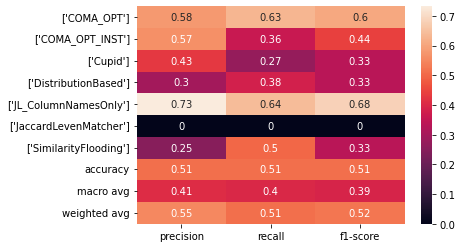

In [216]:
clf_report = metrics.classification_report(y_test, clf.predict(X_test), output_dict=True)
seaborn.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True)

In [217]:
# Setting dpi to make image clearer than default
fig, axes = plt.subplots(dpi=400)

tree.plot_tree(clf,
           feature_names = X.columns, 
           class_names = sorted(data["ordered_simple_best_method_names"].unique().tolist()),
           filled = True);

# You can save your plot if you want
fig.savefig('imagename.png', bbox_inches="tight")

# Classify on knowable properties, but only decide schema or instance

In [259]:
knowable_best_method_properties.head()

,experiment_name,cleaned,provenance,avg_intersection_perc_100_samples,ordered_simple_best_method_names,schema_or_instance_based_methods,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,datasets_nrows_diff,datasets_ncols_diff,datasets_nrows_max,datasets_ncols_max,schema_or_instance
0,book_titles-collaborative_books_df,True,real,0.01000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1251045,5,1447341,7,schema
1,book_titles_-_collaborative_book_metadata,True,real,0.00000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1447245,9,1447341,11,schema
2,collaborative_book_metadata-collaborative_books_df,True,real,0.06000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",3.0,3.0,0.000000,196200,4,196296,11,schema
3,Frosttage_Heissetage,False,real,0.03000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,schema
4,Frosttage_Niederschlag,False,real,0.00125,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,schema


In [260]:
def schema_or_instance(schema_or_instance_dict):
    # We prefer schema based methods, they're faster.
    if schema_or_instance_dict["best_methods_include_schema_methods"]:
        return "schema"
    else:
        return "instance"

knowable_best_method_properties["schema_or_instance"] = knowable_best_method_properties["schema_or_instance_based_methods"].apply(schema_or_instance)
knowable_best_method_properties.head()

C:\Users\Phaina\AppData\Local\Temp/ipykernel_26548/2094498142.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  knowable_best_method_properties["schema_or_instance"] = knowable_best_method_properties["schema_or_instance_based_methods"].apply(schema_or_instance)


,experiment_name,cleaned,provenance,avg_intersection_perc_100_samples,ordered_simple_best_method_names,schema_or_instance_based_methods,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,datasets_nrows_diff,datasets_ncols_diff,datasets_nrows_max,datasets_ncols_max,schema_or_instance
0,book_titles-collaborative_books_df,True,real,0.01000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1251045,5,1447341,7,schema
1,book_titles_-_collaborative_book_metadata,True,real,0.00000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1447245,9,1447341,11,schema
2,collaborative_book_metadata-collaborative_books_df,True,real,0.06000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",3.0,3.0,0.000000,196200,4,196296,11,schema
3,Frosttage_Heissetage,False,real,0.03000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,schema
4,Frosttage_Niederschlag,False,real,0.00125,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,schema


In [323]:
data = pd.get_dummies(knowable_best_method_properties, prefix=['cleaned', 'provenance', 'schema_or_instance'], columns = ['cleaned', 'provenance', 'schema_or_instance'], drop_first=True)
data.head()

,experiment_name,avg_intersection_perc_100_samples,ordered_simple_best_method_names,schema_or_instance_based_methods,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,datasets_nrows_diff,datasets_ncols_diff,datasets_nrows_max,datasets_ncols_max,cleaned_True,provenance_synthetic,schema_or_instance_schema
0,book_titles-collaborative_books_df,0.01000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1251045,5,1447341,7,1,0,1
1,book_titles_-_collaborative_book_metadata,0.00000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1447245,9,1447341,11,1,0,1
2,collaborative_book_metadata-collaborative_books_df,0.06000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",3.0,3.0,0.000000,196200,4,196296,11,1,0,1
3,Frosttage_Heissetage,0.03000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,0,0,1
4,Frosttage_Niederschlag,0.00125,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,0,0,1


In [313]:
data["schema_or_instance_schema"].value_counts()

1    408
0    190
Name: schema_or_instance_schema, dtype: int64

In [314]:
#X = data.drop(["ordered_simple_best_method_names", "experiment_name", "schema_or_instance_based_methods", "schema_or_instance_schema"], axis=1)
y = data["schema_or_instance_schema"]
X_train, X_test, y_train, y_test = train_test_split(data, y, test_size=0.33, random_state=42)

In [315]:
X_train["schema_or_instance_schema"].value_counts()

1    277
0    123
Name: schema_or_instance_schema, dtype: int64

In [316]:
X_test["schema_or_instance_schema"].value_counts()

1    131
0     67
Name: schema_or_instance_schema, dtype: int64

In [317]:
X_train.drop(["ordered_simple_best_method_names", "experiment_name", "schema_or_instance_based_methods", "schema_or_instance_schema"], axis=1, inplace=True)
X_test.drop(["ordered_simple_best_method_names", "experiment_name", "schema_or_instance_based_methods", "schema_or_instance_schema"], axis=1, inplace=True)

In [318]:
clf = tree.DecisionTreeClassifier(max_depth=3)
clf = clf.fit(X_train, 
              y_train)

In [319]:
metrics.accuracy_score(y_test, clf.predict(X_test))

0.6818181818181818

In [320]:
metrics.balanced_accuracy_score(y_test, clf.predict(X_test))

0.7340207360145836

In [290]:
# Or random forest?
forest = RandomForestClassifier(random_state=0, class_weight='balanced_subsample')
forest.fit(X_train, y_train)
print(metrics.balanced_accuracy_score(y_test, forest.predict(X_test)))

cf_matrix = metrics.confusion_matrix(y_test, forest.predict(X_test))
df_cf_matrix = pd.DataFrame(cf_matrix)
df_cf_matrix.rename(index={0:"instance-based", 1:"schema-based"}, inplace=True)
df_cf_matrix.rename(columns={0:"instance-based", 1:"schema-based"}, inplace=True)
df_cf_matrix

0.6801868519995442


,instance-based,schema-based
instance-based,40,27
schema-based,31,100


In [291]:
clf_report = metrics.classification_report(y_test, clf.predict(X_test), output_dict=True)
clf_report["instance-based"] = clf_report.pop("0")
clf_report["schema-based"] = clf_report.pop("1")
df_clf_report = pd.DataFrame(clf_report).iloc[:-1, :].T
df_clf_report = df_clf_report.reindex(["instance-based", "schema-based", "accuracy", "macro avg", "weighted avg"])

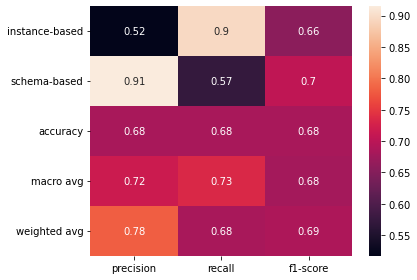

In [226]:
svm = seaborn.heatmap(df_clf_report, annot=True)

figure = svm.get_figure()    
plt.tight_layout()
figure.savefig('fig/knowable_properties_schema_or_instance_based_classification.png', dpi=400)

In [292]:
cf_matrix = metrics.confusion_matrix(y_test, clf.predict(X_test))
df_cf_matrix = pd.DataFrame(cf_matrix).T
df_cf_matrix.rename(index={0:"instance-based", 1:"schema-based"}, inplace=True)
df_cf_matrix.rename(columns={0:"instance-based", 1:"schema-based"}, inplace=True)
df_cf_matrix

,instance-based,schema-based
instance-based,60,56
schema-based,7,75


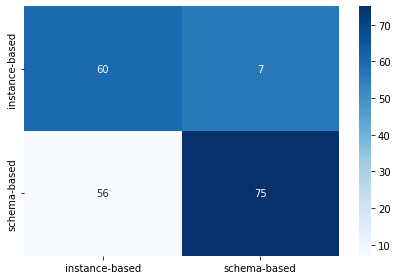

In [228]:
#group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v2}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)

svm2 = seaborn.heatmap(df_cf_matrix, annot=labels, fmt="", cmap='Blues')
figure = svm2.get_figure()    
plt.tight_layout()
figure.savefig('fig/knowable_properties_schema_or_instance_based_confusion_matrix.png', dpi=400)


In [229]:
# Setting dpi to make image clearer than default
fig, axes = plt.subplots(dpi=400)

col_names = [x if x not in translate_col_names_to_thesis_version else translate_col_names_to_thesis_version[x] for x in X_train.columns.to_list()]

tree.plot_tree(clf,
           feature_names = col_names, 
           class_names = ['instance-based', 'schema-based'],
           filled = True,
           fontsize = 16,
           impurity = False);

# You can save your plot if you want
fig.savefig('fig/knowable_properties_schema_or_instance_based_decision_tree.png', bbox_inches="tight")

In [230]:
clf.predict(X_test)

array([0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1,
       1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
      dtype=uint8)

## Classify on knowable properties, algorithm name

In [370]:
data.head()

,experiment_name,avg_intersection_perc_100_samples,ordered_simple_best_method_names,schema_or_instance_based_methods,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,datasets_nrows_diff,datasets_ncols_diff,datasets_nrows_max,datasets_ncols_max,cleaned_True,provenance_synthetic,schema_or_instance_schema
0,book_titles-collaborative_books_df,0.01000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1251045,5,1447341,7,1,0,1
1,book_titles_-_collaborative_book_metadata,0.00000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",2.0,2.0,0.001622,1447245,9,1447341,11,1,0,1
2,collaborative_book_metadata-collaborative_books_df,0.06000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",3.0,3.0,0.000000,196200,4,196296,11,1,0,1
3,Frosttage_Heissetage,0.03000,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,0,0,1
4,Frosttage_Niederschlag,0.00125,['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",16.0,16.0,0.000000,0,0,412,16,0,0,1


In [371]:
# remove rows where we have multiple best methods
data = data[~data["ordered_simple_best_method_names"].isin(["['COMA_OPT_INST', 'JL_ColumnNamesOnly']", 
                                                            "['COMA_OPT', 'JL_ColumnNamesOnly']",
                                                            "['COMA_OPT', 'COMA_OPT_INST']"])]
data["ordered_simple_best_method_names"].value_counts()

['JL_ColumnNamesOnly']     193
['COMA_OPT']               126
['COMA_OPT_INST']           90
['DistributionBased']       68
['SimilarityFlooding']      57
['JaccardLevenMatcher']     32
['Cupid']                   27
Name: ordered_simple_best_method_names, dtype: int64

In [372]:
y = data["ordered_simple_best_method_names"]
X_train, X_test, y_train, y_test = train_test_split(data, y, test_size=0.33, random_state=42)

In [373]:
X_train.drop(["ordered_simple_best_method_names", "experiment_name", "schema_or_instance_based_methods", "schema_or_instance_schema"], axis=1, inplace=True)
X_test.drop(["ordered_simple_best_method_names", "experiment_name", "schema_or_instance_based_methods", "schema_or_instance_schema"], axis=1, inplace=True)

In [374]:
X_train.head()

,avg_intersection_perc_100_samples,avg_exact_col_match,avg_fuzzy_col_match,avg_null_attributes,datasets_nrows_diff,datasets_ncols_diff,datasets_nrows_max,datasets_ncols_max,cleaned_True,provenance_synthetic
190,0.000,1.0,2.0,0.406839,0,0,7500,12,0,1
286,0.000,0.0,0.0,0.000089,5813,0,17440,26,0,1
548,0.000,0.0,0.0,0.103911,0,1,7491,12,0,1
461,0.098,15.0,15.5,0.085754,0,1,14982,19,0,1
264,0.000,0.0,2.0,0.000093,0,0,23254,33,0,1


In [375]:
y_train.value_counts().index.to_list()

["['JL_ColumnNamesOnly']",
 "['COMA_OPT']",
 "['COMA_OPT_INST']",
 "['DistributionBased']",
 "['SimilarityFlooding']",
 "['JaccardLevenMatcher']",
 "['Cupid']"]

In [376]:
clf = tree.DecisionTreeClassifier(max_depth=6)
clf = clf.fit(X_train, 
              y_train)

In [377]:
metrics.balanced_accuracy_score(y_test, clf.predict(X_test))

0.41408343640486495

In [381]:
cf_matrix = metrics.confusion_matrix(y_test, clf.predict(X_test), labels=["['JL_ColumnNamesOnly']",
                                                                         "['COMA_OPT']",
                                                                         "['COMA_OPT_INST']",
                                                                         "['DistributionBased']",
                                                                         "['SimilarityFlooding']",
                                                                         "['JaccardLevenMatcher']",
                                                                         "['Cupid']"])
df_cf_matrix = pd.DataFrame(cf_matrix)
df_cf_matrix.rename(index={0:"JaccardLevenMatcherColNamesOnly", 
                           1:"Coma_OPT",
                          2:"Coma_OPT_INST",
                          3:"DistributionBased",
                          4:"SimilarityFlooding",
                          5:"JaccardLevenMatcher",
                          6:"Cupid"}, inplace=True)
df_cf_matrix.rename(columns={0:"JaccardLevenMatcherColNamesOnly", 
                           1:"Coma_OPT",
                          2:"Coma_OPT_INST",
                          3:"DistributionBased",
                          4:"SimilarityFlooding",
                          5:"JaccardLevenMatcher",
                          6:"Cupid"}, inplace=True)
df_cf_matrix

,JaccardLevenMatcherColNamesOnly,Coma_OPT,Coma_OPT_INST,DistributionBased,SimilarityFlooding,JaccardLevenMatcher,Cupid
JaccardLevenMatcherColNamesOnly,38,7,6,8,5,0,0
Coma_OPT,5,23,4,9,5,0,0
Coma_OPT_INST,1,2,10,12,11,0,0
DistributionBased,3,0,2,9,6,0,1
SimilarityFlooding,0,0,0,1,11,0,0
JaccardLevenMatcher,2,0,2,2,0,0,0
Cupid,3,1,1,0,3,1,2


In [363]:
# Or random forest?
forest = RandomForestClassifier(random_state=0, class_weight='balanced_subsample')
forest.fit(X_train, y_train)
print(metrics.balanced_accuracy_score(y_test, forest.predict(X_test)))

cf_matrix = metrics.confusion_matrix(y_test, forest.predict(X_test))
df_cf_matrix = pd.DataFrame(cf_matrix)
#df_cf_matrix.rename(index={0:"instance-based", 1:"schema-based"}, inplace=True)
#df_cf_matrix.rename(columns={0:"instance-based", 1:"schema-based"}, inplace=True)
df_cf_matrix

0.37888674903426456


,0,1,2,3,4,5,6
0,27,3,0,5,6,0,5
1,4,13,0,6,2,2,9
2,0,2,2,0,3,2,2
3,0,1,0,9,3,5,3
4,5,2,3,4,38,8,4
5,1,0,0,1,2,0,2
6,1,1,0,1,2,1,6


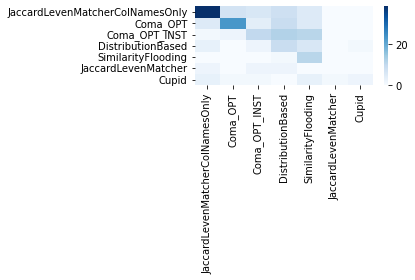

In [382]:
svm2 = seaborn.heatmap(df_cf_matrix, cmap='Blues')
figure = svm2.get_figure()
plt.tight_layout()
figure.savefig('fig/knowable_properties_algorithm_confusion_matrix.png', dpi=400)

In [384]:
y_train.value_counts()

['JL_ColumnNamesOnly']     129
['COMA_OPT']                80
['COMA_OPT_INST']           54
['DistributionBased']       47
['SimilarityFlooding']      45
['JaccardLevenMatcher']     26
['Cupid']                   16
Name: ordered_simple_best_method_names, dtype: int64

In [391]:
tree.export_text(clf, feature_names=col_names)

"|--- nColMax <= 14.50\n|   |--- avgFuzzyColMatch <= 0.50\n|   |   |--- nRowMax <= 14991.00\n|   |   |   |--- avgNullAttributes <= 0.10\n|   |   |   |   |--- nColDiff <= 0.50\n|   |   |   |   |   |--- avgNullAttributes <= 0.09\n|   |   |   |   |   |   |--- class: ['JL_ColumnNamesOnly']\n|   |   |   |   |   |--- avgNullAttributes >  0.09\n|   |   |   |   |   |   |--- class: ['COMA_OPT_INST']\n|   |   |   |   |--- nColDiff >  0.50\n|   |   |   |   |   |--- class: ['JL_ColumnNamesOnly']\n|   |   |   |--- avgNullAttributes >  0.10\n|   |   |   |   |--- nRowDiff <= 3747.50\n|   |   |   |   |   |--- nColDiff <= 0.50\n|   |   |   |   |   |   |--- class: ['JL_ColumnNamesOnly']\n|   |   |   |   |   |--- nColDiff >  0.50\n|   |   |   |   |   |   |--- class: ['JL_ColumnNamesOnly']\n|   |   |   |   |--- nRowDiff >  3747.50\n|   |   |   |   |   |--- class: ['COMA_OPT']\n|   |   |--- nRowMax >  14991.00\n|   |   |   |--- class: ['COMA_OPT']\n|   |--- avgFuzzyColMatch >  0.50\n|   |   |--- nRowMax <=

In [387]:
# Setting dpi to make image clearer than default
fig, axes = plt.subplots(dpi=400)

col_names = [x if x not in translate_col_names_to_thesis_version else translate_col_names_to_thesis_version[x] for x in X_train.columns.to_list()]

tree.plot_tree(clf,
           feature_names = col_names, 
           class_names = ['COMA_OPT', 'COMA_OPT_INST', 'Cupid', 'DistributionBased', 'JaccardLevenMatcherColNamesOnly', 'JaccardLevenMatcher', 'SimilarityFlooding'],
           filled = True,
           #fontsize = 10,
           impurity = False);

# You can save your plot if you want
fig.savefig('fig/knowable_properties_algorithm_decision_tree.png', bbox_inches="tight")

### Random forest

In [231]:
forest = RandomForestClassifier(random_state=0, class_weight='balanced_subsample')
forest.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', random_state=0)

In [232]:
import time
import numpy as np

start_time = time.time()
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

Elapsed time to compute the importances: 0.016 seconds


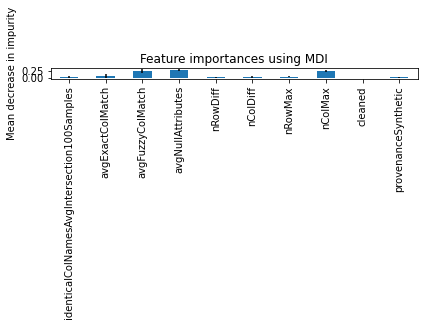

In [246]:
forest_importances = pd.Series(importances, index=col_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax, rot=90)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [247]:
from sklearn.inspection import permutation_importance

start_time = time.time()
result = permutation_importance(
    forest, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(result.importances_mean, index=col_names)

Elapsed time to compute the importances: 3.545 seconds


In [248]:
forest_importances

identicalColNamesAvgIntersection100Samples    0.003030
avgExactColMatch                             -0.001010
avgFuzzyColMatch                              0.067677
avgNullAttributes                            -0.000505
nRowDiff                                      0.011111
nColDiff                                     -0.003535
nRowMax                                       0.005556
nColMax                                       0.057071
cleaned                                       0.000000
provenanceSynthetic                          -0.002020
dtype: float64

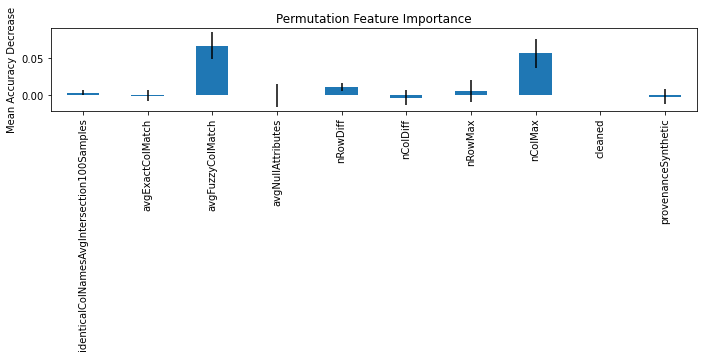

In [258]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax, figsize=(10, 5))
ax.set_title("Permutation Feature Importance")
ax.set_ylabel("Mean Accuracy Decrease")
fig.tight_layout()

fig.savefig('fig/knowable_properties_schema_or_instance_based_feature_importance.png', dpi=400)

In [115]:
metrics.accuracy_score(y_test, forest.predict(X_test))

0.7070707070707071

<AxesSubplot:>

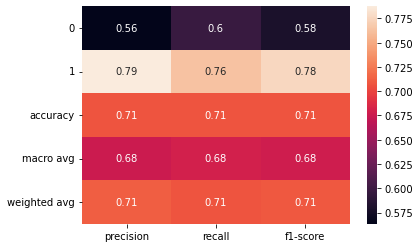

In [116]:
clf_report = metrics.classification_report(y_test, forest.predict(X_test), output_dict=True)
seaborn.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True)

# Classify on all properties

In [117]:
simple_best_method_properties.head()

,experiment_name,cleaned,provenance,split_type,median_unique_values_dists,median_str_dists,relationship_type,instances_noisy_verbatim,schema_noisy_verbatim,avg_obfuscators_by_dtype,avg_obfuscators_by_colname,rel_string,rel_numeric,avg_intersection_perc_100_samples,column_names_string_distance,percentage_cols_involved_in_rel,ordered_simple_best_method_names,schema_or_instance_based_methods,max_JL_cutoff,datasets_nrows_diff,datasets_ncols_diff,min_avg_obfuscators_by_dtype,max_avg_obfuscators_by_dtype,avg_avg_obfuscators_by_dtype,min_avg_obfuscators_by_colname,max_avg_obfuscators_by_colname,avg_avg_obfuscators_by_colname,min_column_names_string_distance,max_column_names_string_distance,avg_column_names_string_distance,min_percentage_cols_involved_in_rel,max_percentage_cols_involved_in_rel,avg_percentage_cols_involved_in_rel
0,book_titles-collaborative_books_df,True,real,no_split,1249156.0,2.163001,join,verbatim,verbatim,"[0.0, 2.0]","[0.0, 0.0]",True,True,0.01000,"[0.0, 0.0]","dict_values([1.0, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1251045,5,0.000,2.000,1.00,0.0,0.0,0.0,0.0,0.0,0.0,0.285714,1.000000,0.642857
1,book_titles_-_collaborative_book_metadata,True,real,no_split,1249950.5,-1.665304,join,verbatim,verbatim,"[0.0, 4.5]","[0.0, 0.0]",True,True,0.00000,"[0.0, 0.0]","dict_values([1.0, 0.18181818181818182])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1447245,9,0.000,4.500,2.25,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,1.000000,0.590909
2,collaborative_book_metadata-collaborative_books_df,True,real,no_split,-794.5,3.828306,join,verbatim,verbatim,"[4.5, 2.0]","[0.0, 0.0]",True,True,0.06000,"[0.0, 0.0]","dict_values([0.18181818181818182, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,196200,4,2.000,4.500,3.25,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,0.285714,0.233766
3,Frosttage_Heissetage,False,real,no_split,56.5,0.069175,union,verbatim,verbatim,"[9.875, 6.125]","[0.0, 0.0]",True,True,0.03000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0,6.125,9.875,8.00,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000
4,Frosttage_Niederschlag,False,real,no_split,56.5,0.069175,union,verbatim,verbatim,"[9.875, 6.125]","[0.0, 0.0]",True,True,0.00125,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0,6.125,9.875,8.00,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000


In [123]:
simple_best_method_properties["schema_or_instance"] = simple_best_method_properties["schema_or_instance_based_methods"].apply(schema_or_instance)
simple_best_method_properties.head()

C:\Users\Phaina\AppData\Local\Temp/ipykernel_26548/696266328.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  simple_best_method_properties["schema_or_instance"] = simple_best_method_properties["schema_or_instance_based_methods"].apply(schema_or_instance)


,experiment_name,cleaned,provenance,split_type,median_unique_values_dists,median_str_dists,relationship_type,instances_noisy_verbatim,schema_noisy_verbatim,avg_obfuscators_by_dtype,avg_obfuscators_by_colname,rel_string,rel_numeric,avg_intersection_perc_100_samples,column_names_string_distance,percentage_cols_involved_in_rel,ordered_simple_best_method_names,schema_or_instance_based_methods,max_JL_cutoff,datasets_nrows_diff,datasets_ncols_diff,min_avg_obfuscators_by_dtype,max_avg_obfuscators_by_dtype,avg_avg_obfuscators_by_dtype,min_avg_obfuscators_by_colname,max_avg_obfuscators_by_colname,avg_avg_obfuscators_by_colname,min_column_names_string_distance,max_column_names_string_distance,avg_column_names_string_distance,min_percentage_cols_involved_in_rel,max_percentage_cols_involved_in_rel,avg_percentage_cols_involved_in_rel,schema_or_instance
0,book_titles-collaborative_books_df,True,real,no_split,1249156.0,2.163001,join,verbatim,verbatim,"[0.0, 2.0]","[0.0, 0.0]",True,True,0.01000,"[0.0, 0.0]","dict_values([1.0, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1251045,5,0.000,2.000,1.00,0.0,0.0,0.0,0.0,0.0,0.0,0.285714,1.000000,0.642857,schema
1,book_titles_-_collaborative_book_metadata,True,real,no_split,1249950.5,-1.665304,join,verbatim,verbatim,"[0.0, 4.5]","[0.0, 0.0]",True,True,0.00000,"[0.0, 0.0]","dict_values([1.0, 0.18181818181818182])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1447245,9,0.000,4.500,2.25,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,1.000000,0.590909,schema
2,collaborative_book_metadata-collaborative_books_df,True,real,no_split,-794.5,3.828306,join,verbatim,verbatim,"[4.5, 2.0]","[0.0, 0.0]",True,True,0.06000,"[0.0, 0.0]","dict_values([0.18181818181818182, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,196200,4,2.000,4.500,3.25,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,0.285714,0.233766,schema
3,Frosttage_Heissetage,False,real,no_split,56.5,0.069175,union,verbatim,verbatim,"[9.875, 6.125]","[0.0, 0.0]",True,True,0.03000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0,6.125,9.875,8.00,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,schema
4,Frosttage_Niederschlag,False,real,no_split,56.5,0.069175,union,verbatim,verbatim,"[9.875, 6.125]","[0.0, 0.0]",True,True,0.00125,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0,6.125,9.875,8.00,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,schema


In [199]:
data = pd.get_dummies(simple_best_method_properties, 
                      prefix=['cleaned', 'provenance', 'split_type', 'relationship_type',
                                'instances_noisy_verbatim', 'schema_noisy_verbatim', 'rel_string',
                                'rel_numeric', 'schema_or_instance'], 
                      columns=['cleaned', 'provenance', 'split_type', 'relationship_type',
                                'instances_noisy_verbatim', 'schema_noisy_verbatim', 'rel_string',
                                'rel_numeric', 'schema_or_instance'], 
                      drop_first=True)
data.head()

,experiment_name,median_unique_values_dists,median_str_dists,avg_obfuscators_by_dtype,avg_obfuscators_by_colname,avg_intersection_perc_100_samples,column_names_string_distance,percentage_cols_involved_in_rel,ordered_simple_best_method_names,schema_or_instance_based_methods,max_JL_cutoff,datasets_nrows_diff,datasets_ncols_diff,min_avg_obfuscators_by_dtype,max_avg_obfuscators_by_dtype,avg_avg_obfuscators_by_dtype,min_avg_obfuscators_by_colname,max_avg_obfuscators_by_colname,avg_avg_obfuscators_by_colname,min_column_names_string_distance,max_column_names_string_distance,avg_column_names_string_distance,min_percentage_cols_involved_in_rel,max_percentage_cols_involved_in_rel,avg_percentage_cols_involved_in_rel,cleaned_True,provenance_synthetic,split_type_horizontal,split_type_no_split,split_type_vertical,relationship_type_join/semantic join,relationship_type_semantic join,relationship_type_union,relationship_type_view union,instances_noisy_verbatim_verbatim,schema_noisy_verbatim_verbatim,rel_string_True,rel_numeric_True,schema_or_instance_schema
0,book_titles-collaborative_books_df,1249156.0,2.163001,"[0.0, 2.0]","[0.0, 0.0]",0.01000,"[0.0, 0.0]","dict_values([1.0, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1251045,5,0.000,2.000,1.00,0.0,0.0,0.0,0.0,0.0,0.0,0.285714,1.000000,0.642857,1,0,0,1,0,0,0,0,0,1,1,1,1,1
1,book_titles_-_collaborative_book_metadata,1249950.5,-1.665304,"[0.0, 4.5]","[0.0, 0.0]",0.00000,"[0.0, 0.0]","dict_values([1.0, 0.18181818181818182])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1447245,9,0.000,4.500,2.25,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,1.000000,0.590909,1,0,0,1,0,0,0,0,0,1,1,1,1,1
2,collaborative_book_metadata-collaborative_books_df,-794.5,3.828306,"[4.5, 2.0]","[0.0, 0.0]",0.06000,"[0.0, 0.0]","dict_values([0.18181818181818182, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,196200,4,2.000,4.500,3.25,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,0.285714,0.233766,1,0,0,1,0,0,0,0,0,1,1,1,1,1
3,Frosttage_Heissetage,56.5,0.069175,"[9.875, 6.125]","[0.0, 0.0]",0.03000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0,6.125,9.875,8.00,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,0,0,0,1,0,0,0,1,0,1,1,1,1,1
4,Frosttage_Niederschlag,56.5,0.069175,"[9.875, 6.125]","[0.0, 0.0]",0.00125,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0,6.125,9.875,8.00,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,0,0,0,1,0,0,0,1,0,1,1,1,1,1


In [200]:
data["ordered_simple_best_method_names"].value_counts()

['JL_ColumnNamesOnly']                     193
['COMA_OPT']                               126
['COMA_OPT_INST']                           90
['DistributionBased']                       68
['SimilarityFlooding']                      57
['JaccardLevenMatcher']                     32
['Cupid']                                   27
['COMA_OPT_INST', 'JL_ColumnNamesOnly']      2
['COMA_OPT', 'JL_ColumnNamesOnly']           2
['COMA_OPT', 'COMA_OPT_INST']                1
Name: ordered_simple_best_method_names, dtype: int64

### schema-based or instance-based

In [201]:
data["schema_or_instance_schema"].value_counts()

1    408
0    190
Name: schema_or_instance_schema, dtype: int64

In [202]:
X = data.drop(["avg_obfuscators_by_dtype", "min_avg_obfuscators_by_dtype", "max_avg_obfuscators_by_dtype", "min_avg_obfuscators_by_colname", 
               "max_avg_obfuscators_by_colname", "min_column_names_string_distance", "max_column_names_string_distance", "min_percentage_cols_involved_in_rel",
               "max_percentage_cols_involved_in_rel", 
              "avg_obfuscators_by_colname", "column_names_string_distance", "percentage_cols_involved_in_rel", "max_JL_cutoff"], axis=1)
y = data["schema_or_instance_schema"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [203]:
X_train["schema_or_instance_schema"].value_counts()

1    277
0    123
Name: schema_or_instance_schema, dtype: int64

In [204]:
X_train.drop(["ordered_simple_best_method_names", "experiment_name", "schema_or_instance_based_methods", "schema_or_instance_schema"], axis=1, inplace=True)
X_test.drop(["ordered_simple_best_method_names", "experiment_name", "schema_or_instance_based_methods", "schema_or_instance_schema"], axis=1, inplace=True)

In [205]:
X_train.head()

,median_unique_values_dists,median_str_dists,avg_intersection_perc_100_samples,datasets_nrows_diff,datasets_ncols_diff,avg_avg_obfuscators_by_dtype,avg_avg_obfuscators_by_colname,avg_column_names_string_distance,avg_percentage_cols_involved_in_rel,cleaned_True,provenance_synthetic,split_type_horizontal,split_type_no_split,split_type_vertical,relationship_type_join/semantic join,relationship_type_semantic join,relationship_type_union,relationship_type_view union,instances_noisy_verbatim_verbatim,schema_noisy_verbatim_verbatim,rel_string_True,rel_numeric_True
507,15.0,-0.003137,0.00,0,1,10.000000,0.433333,0.861383,0.811404,0,1,0,0,1,0,1,0,0,0,0,1,1
149,0.0,0.000000,0.00,0,0,9.217391,0.782609,0.762530,1.000000,0,1,1,0,0,0,0,1,0,0,0,1,1
124,0.0,0.000000,0.01,0,0,2.000000,0.000000,0.000000,0.083333,0,1,0,0,1,0,1,0,0,0,1,0,1
547,0.0,-0.817114,0.00,0,1,7.000000,0.000000,0.529412,0.087121,0,1,0,0,0,0,0,0,1,1,0,1,0
464,-3745.0,-0.501328,0.00,3745,1,7.000000,0.000000,0.625000,0.087121,0,1,0,0,0,0,1,0,0,0,0,1,0


In [206]:
clf = tree.DecisionTreeClassifier(max_depth=3)
clf = clf.fit(X_train, 
              y_train)

In [207]:
metrics.balanced_accuracy_score(y_test, clf.predict(X_test))

0.7858607724735103

In [208]:
cf_matrix = metrics.confusion_matrix(y_test, clf.predict(X_test))
df_cf_matrix = pd.DataFrame(cf_matrix)
df_cf_matrix.rename(index={0:"instance-based", 1:"schema-based"}, inplace=True)
df_cf_matrix.rename(columns={0:"instance-based", 1:"schema-based"}, inplace=True)
df_cf_matrix

,instance-based,schema-based
instance-based,47,20
schema-based,17,114


In [211]:
# Setting dpi to make image clearer than default
fig, axes = plt.subplots(dpi=400)

col_names = [x if x not in translate_col_names_to_thesis_version else translate_col_names_to_thesis_version[x] for x in X_train.columns.to_list()]

tree.plot_tree(clf,
           feature_names = col_names, 
           class_names = ['instance-based', 'schema-based'],
           filled = True,
           fontsize = 14,
           impurity = False);

# You can save your plot if you want
fig.savefig('fig/all_properties_schema_or_instance_based_decision_tree.png', bbox_inches="tight")

In [212]:
text_representation = tree.export_text(clf, feature_names = X_train.columns.to_list())
print(text_representation)

|--- avg_column_names_string_distance <= 0.56
|   |--- avg_column_names_string_distance <= 0.44
|   |   |--- class: 1
|   |--- avg_column_names_string_distance >  0.44
|   |   |--- avg_column_names_string_distance <= 0.45
|   |   |   |--- class: 0
|   |   |--- avg_column_names_string_distance >  0.45
|   |   |   |--- class: 1
|--- avg_column_names_string_distance >  0.56
|   |--- avg_percentage_cols_involved_in_rel <= 0.40
|   |   |--- median_str_dists <= -0.00
|   |   |   |--- class: 1
|   |   |--- median_str_dists >  -0.00
|   |   |   |--- class: 1
|   |--- avg_percentage_cols_involved_in_rel >  0.40
|   |   |--- median_unique_values_dists <= 22.00
|   |   |   |--- class: 0
|   |   |--- median_unique_values_dists >  22.00
|   |   |   |--- class: 0



### algorithm

In [276]:
data = pd.get_dummies(simple_best_method_properties, 
                      prefix=['cleaned', 'provenance', 'split_type', 'relationship_type',
                                'instances_noisy_verbatim', 'schema_noisy_verbatim', 'rel_string',
                                'rel_numeric', 'schema_or_instance'], 
                      columns=['cleaned', 'provenance', 'split_type', 'relationship_type',
                                'instances_noisy_verbatim', 'schema_noisy_verbatim', 'rel_string',
                                'rel_numeric', 'schema_or_instance'], 
                      drop_first=True)
data.head()

,experiment_name,median_unique_values_dists,median_str_dists,avg_obfuscators_by_dtype,avg_obfuscators_by_colname,avg_intersection_perc_100_samples,column_names_string_distance,percentage_cols_involved_in_rel,ordered_simple_best_method_names,schema_or_instance_based_methods,max_JL_cutoff,datasets_nrows_diff,datasets_ncols_diff,min_avg_obfuscators_by_dtype,max_avg_obfuscators_by_dtype,avg_avg_obfuscators_by_dtype,min_avg_obfuscators_by_colname,max_avg_obfuscators_by_colname,avg_avg_obfuscators_by_colname,min_column_names_string_distance,max_column_names_string_distance,avg_column_names_string_distance,min_percentage_cols_involved_in_rel,max_percentage_cols_involved_in_rel,avg_percentage_cols_involved_in_rel,cleaned_True,provenance_synthetic,split_type_horizontal,split_type_no_split,split_type_vertical,relationship_type_join/semantic join,relationship_type_semantic join,relationship_type_union,relationship_type_view union,instances_noisy_verbatim_verbatim,schema_noisy_verbatim_verbatim,rel_string_True,rel_numeric_True,schema_or_instance_schema
0,book_titles-collaborative_books_df,1249156.0,2.163001,"[0.0, 2.0]","[0.0, 0.0]",0.01000,"[0.0, 0.0]","dict_values([1.0, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1251045,5,0.000,2.000,1.00,0.0,0.0,0.0,0.0,0.0,0.0,0.285714,1.000000,0.642857,1,0,0,1,0,0,0,0,0,1,1,1,1,1
1,book_titles_-_collaborative_book_metadata,1249950.5,-1.665304,"[0.0, 4.5]","[0.0, 0.0]",0.00000,"[0.0, 0.0]","dict_values([1.0, 0.18181818181818182])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,1447245,9,0.000,4.500,2.25,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,1.000000,0.590909,1,0,0,1,0,0,0,0,0,1,1,1,1,1
2,collaborative_book_metadata-collaborative_books_df,-794.5,3.828306,"[4.5, 2.0]","[0.0, 0.0]",0.06000,"[0.0, 0.0]","dict_values([0.18181818181818182, 0.2857142857142857])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,196200,4,2.000,4.500,3.25,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,0.285714,0.233766,1,0,0,1,0,0,0,0,0,1,1,1,1,1
3,Frosttage_Heissetage,56.5,0.069175,"[9.875, 6.125]","[0.0, 0.0]",0.03000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0,6.125,9.875,8.00,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,0,0,0,1,0,0,0,1,0,1,1,1,1,1
4,Frosttage_Niederschlag,56.5,0.069175,"[9.875, 6.125]","[0.0, 0.0]",0.00125,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0.8,0,0,6.125,9.875,8.00,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,0,0,0,1,0,0,0,1,0,1,1,1,1,1


In [277]:
# remove rows where we have multiple best methods
data = data[~data["ordered_simple_best_method_names"].isin(["['COMA_OPT_INST', 'JL_ColumnNamesOnly']", 
                                                            "['COMA_OPT', 'JL_ColumnNamesOnly']",
                                                            "['COMA_OPT', 'COMA_OPT_INST']"])]
data["ordered_simple_best_method_names"].value_counts()

['JL_ColumnNamesOnly']     193
['COMA_OPT']               126
['COMA_OPT_INST']           90
['DistributionBased']       68
['SimilarityFlooding']      57
['JaccardLevenMatcher']     32
['Cupid']                   27
Name: ordered_simple_best_method_names, dtype: int64

In [278]:
X = data.drop(["ordered_simple_best_method_names", "experiment_name", "avg_obfuscators_by_dtype",
              "avg_obfuscators_by_colname", "column_names_string_distance", "percentage_cols_involved_in_rel", "max_JL_cutoff"], axis=1)
y = data["ordered_simple_best_method_names"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [280]:
X_train.head()

,median_unique_values_dists,median_str_dists,avg_intersection_perc_100_samples,schema_or_instance_based_methods,datasets_nrows_diff,datasets_ncols_diff,min_avg_obfuscators_by_dtype,max_avg_obfuscators_by_dtype,avg_avg_obfuscators_by_dtype,min_avg_obfuscators_by_colname,max_avg_obfuscators_by_colname,avg_avg_obfuscators_by_colname,min_column_names_string_distance,max_column_names_string_distance,avg_column_names_string_distance,min_percentage_cols_involved_in_rel,max_percentage_cols_involved_in_rel,avg_percentage_cols_involved_in_rel,cleaned_True,provenance_synthetic,split_type_horizontal,split_type_no_split,split_type_vertical,relationship_type_join/semantic join,relationship_type_semantic join,relationship_type_union,relationship_type_view union,instances_noisy_verbatim_verbatim,schema_noisy_verbatim_verbatim,rel_string_True,rel_numeric_True,schema_or_instance_schema
190,0.0,-0.817600,0.000,"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0,0,1.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.083333,0.083333,0.083333,0,1,0,0,0,0,0,0,1,1,1,0,1,1
286,29.0,-1.000000,0.000,"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",5813,0,10.000000,12.000000,11.000000,0.000000,0.000000,0.000000,0.846154,0.846154,0.846154,0.038462,0.038462,0.038462,0,1,0,0,0,0,1,0,0,0,0,1,0,1
548,0.0,-0.823388,0.000,"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0,1,4.000000,10.000000,7.000000,0.000000,0.000000,0.000000,0.375000,0.375000,0.375000,0.083333,0.090909,0.087121,0,1,0,0,0,0,0,0,1,0,0,1,0,1
461,0.0,0.000000,0.098,"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0,1,9.333333,9.333333,9.333333,0.000000,0.066667,0.033333,0.000000,0.000000,0.000000,0.789474,0.833333,0.811404,0,1,0,0,1,0,0,0,0,1,1,1,1,1
264,0.0,0.000000,0.000,"{'best_methods_include_schema_methods': True, 'best_methods_include_instance_methods': False}",0,0,12.933333,13.466667,13.200000,0.133333,0.400000,0.266667,0.261905,0.666667,0.424031,0.454545,0.454545,0.454545,0,1,0,0,1,0,0,0,0,1,0,1,1,1


In [ ]:
X_train.drop(["ordered_simple_best_method_names", "experiment_name", "schema_or_instance_based_methods", "schema_or_instance_schema"], axis=1, inplace=True)
X_test.drop(["ordered_simple_best_method_names", "experiment_name", "schema_or_instance_based_methods", "schema_or_instance_schema"], axis=1, inplace=True)

In [279]:
clf = tree.DecisionTreeClassifier(max_depth=3)
clf = clf.fit(X_train, 
              y_train)

TypeError: float() argument must be a string or a number, not 'dict'

In [274]:
metrics.accuracy_score(y_test, clf.predict(X_test))

0.45408163265306123

C:\Users\Phaina\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Phaina\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Phaina\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<AxesSubplot:>

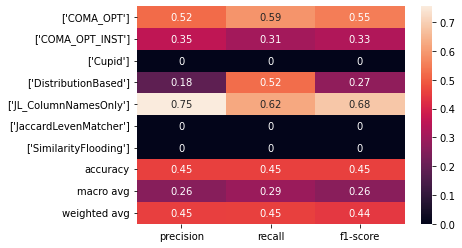

In [275]:
clf_report = metrics.classification_report(y_test, clf.predict(X_test), output_dict=True)
seaborn.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True)

In [45]:
# Setting dpi to make image clearer than default
fig, axes = plt.subplots(dpi=600)

tree.plot_tree(clf,
           feature_names = X.columns, 
           class_names = sorted(data["ordered_simple_best_method_names"].unique().tolist()),
           filled = True);

# You can save your plot if you want
fig.savefig('imagename2.png', bbox_inches="tight")

# Random Forest for feature importance
https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html

In [201]:
X = data.drop(["ordered_simple_best_method_names", "experiment_name", "avg_obfuscators_by_dtype",
              "avg_obfuscators_by_colname", "column_names_string_distance", "percentage_cols_involved_in_rel", "max_JL_cutoff"], axis=1)
y = data["ordered_simple_best_method_names"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

forest = RandomForestClassifier(random_state=0, class_weight='balanced_subsample')
forest.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', random_state=0)

In [202]:
import time
import numpy as np

start_time = time.time()
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

Elapsed time to compute the importances: 0.017 seconds


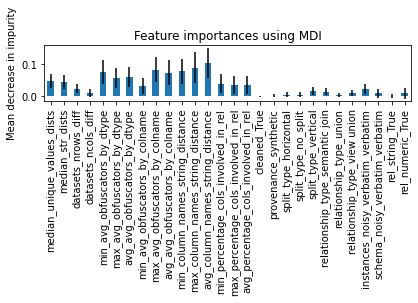

In [203]:
forest_importances = pd.Series(importances, index=X.columns)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [204]:
from sklearn.inspection import permutation_importance

start_time = time.time()
result = permutation_importance(
    forest, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(result.importances_mean, index=X.columns)

Elapsed time to compute the importances: 2.122 seconds


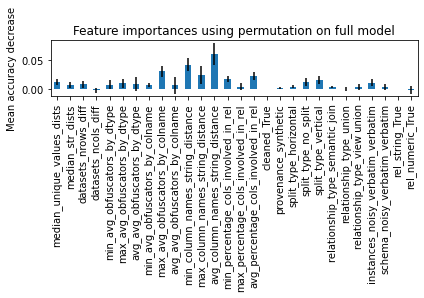

In [205]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [206]:
metrics.accuracy_score(y_test, forest.predict(X_test))

0.7193877551020408

<AxesSubplot:>

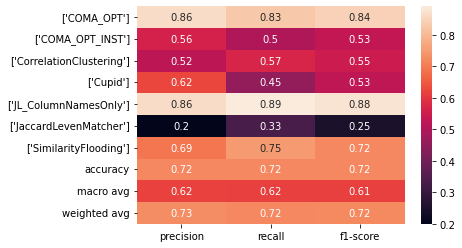

In [207]:
clf_report = metrics.classification_report(y_test, forest.predict(X_test), output_dict=True)
seaborn.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True)

# If JL_ColumnNames_Only is best matcher, what is correct cutoff?

In [208]:
data.head()

,experiment_name,median_unique_values_dists,median_str_dists,avg_obfuscators_by_dtype,avg_obfuscators_by_colname,column_names_string_distance,percentage_cols_involved_in_rel,ordered_simple_best_method_names,max_JL_cutoff,datasets_nrows_diff,datasets_ncols_diff,min_avg_obfuscators_by_dtype,max_avg_obfuscators_by_dtype,avg_avg_obfuscators_by_dtype,min_avg_obfuscators_by_colname,max_avg_obfuscators_by_colname,avg_avg_obfuscators_by_colname,min_column_names_string_distance,max_column_names_string_distance,avg_column_names_string_distance,min_percentage_cols_involved_in_rel,max_percentage_cols_involved_in_rel,avg_percentage_cols_involved_in_rel,cleaned_True,provenance_synthetic,split_type_horizontal,split_type_no_split,split_type_vertical,relationship_type_semantic join,relationship_type_union,relationship_type_view union,instances_noisy_verbatim_verbatim,schema_noisy_verbatim_verbatim,rel_string_True,rel_numeric_True
0,book_titles-collaborative_books_df,1249156.0,2.163001,"[0.0, 2.0]","[0.0, 0.0]","[0.0, 0.0]","dict_values([1.0, 0.2857142857142857])",['JL_ColumnNamesOnly'],0.8,1251045,5,0.000,2.000,1.000,0.0,0.0,0.0,0.0,0.0,0.0,0.285714,1.000000,0.642857,1,0,0,1,0,0,0,0,1,1,1,1
1,book_titles_-_collaborative_book_metadata,1249950.5,-1.665304,"[0.0, 4.5]","[0.0, 0.0]","[0.0, 0.0]","dict_values([1.0, 0.18181818181818182])",['JL_ColumnNamesOnly'],0.8,1447245,9,0.000,4.500,2.250,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,1.000000,0.590909,1,0,0,1,0,0,0,0,1,1,1,1
2,collaborative_book_metadata-collaborative_book...,-794.5,3.828306,"[4.5, 2.0]","[0.0, 0.0]","[0.0, 0.0]","dict_values([0.18181818181818182, 0.2857142857...",['JL_ColumnNamesOnly'],0.8,196200,4,2.000,4.500,3.250,0.0,0.0,0.0,0.0,0.0,0.0,0.181818,0.285714,0.233766,1,0,0,1,0,0,0,0,1,1,1,1
3,Frosttage_Heissetage,56.5,0.069175,"[9.875, 6.125]","[0.0, 0.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],0.8,0,0,6.125,9.875,8.000,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,0,0,0,1,0,0,1,0,1,1,1,1
4,Frosttage_Niederschlag,-891.5,-0.692153,"[9.875, 9.875]","[0.0, 0.0]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","dict_values([1.0, 1.0])",['JL_ColumnNamesOnly'],0.8,5456,0,9.875,9.875,9.875,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,0,0,0,1,0,0,1,0,1,1,1,1


In [209]:
data.max_JL_cutoff.value_counts()

0.5    71
0.8    44
0.6    34
0.7    24
0.4    20
Name: max_JL_cutoff, dtype: int64

In [210]:
JL_data = data[data["ordered_simple_best_method_names"] == "['JL_ColumnNamesOnly']"]

X = JL_data.drop(["ordered_simple_best_method_names", "experiment_name", "avg_obfuscators_by_dtype",
              "avg_obfuscators_by_colname", "column_names_string_distance", "percentage_cols_involved_in_rel", "max_JL_cutoff"], axis=1)
y = JL_data["max_JL_cutoff"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

forest = RandomForestClassifier(random_state=0, class_weight='balanced_subsample')
forest.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', random_state=0)

In [211]:
from sklearn.inspection import permutation_importance

start_time = time.time()
result = permutation_importance(
    forest, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(result.importances_mean, index=X.columns)

Elapsed time to compute the importances: 2.116 seconds


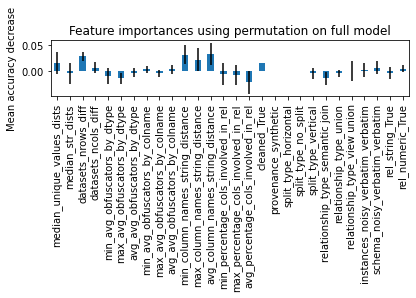

In [212]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [213]:
metrics.accuracy_score(y_test, forest.predict(X_test))

0.640625

<AxesSubplot:>

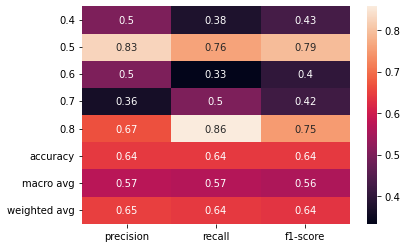

In [215]:
clf_report = metrics.classification_report(y_test, forest.predict(X_test), output_dict=True)
seaborn.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True)

In [232]:
X = JL_data[["avg_column_names_string_distance"]]
y = JL_data["max_JL_cutoff"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

clf = tree.DecisionTreeClassifier(max_depth=2)
clf = clf.fit(X_train, 
              y_train)

In [233]:
metrics.accuracy_score(y_test, clf.predict(X_test))

0.65625

In [234]:
# Setting dpi to make image clearer than default
fig, axes = plt.subplots(dpi=400)

tree.plot_tree(clf,
           feature_names = X.columns, 
           class_names = sorted(JL_data["max_JL_cutoff"].unique().tolist()),
           filled = True);

# You can save your plot if you want
fig.savefig('imagename3.png', bbox_inches="tight")

# Rules of thumb

The bigger the average column name string distance, the lower the cutoff has to be.

Average col name string distance -> best cutoff from depth 2 decision tree
* <= 0.301 - 0.8
* <= 0.762 - 0.5
* => 0.762 - 0.4